In [ ]:
# ==============================================================================
# PART 1: ENVIRONMENT SETUP (5 minutes)
# ==============================================================================

print("=" * 80)
print("PART 1: ENVIRONMENT SETUP")
print("=" * 80)

%pip install -U ultralytics
import ultralytics
print(ultralytics.__version__) # Should be > 8.3.0

import torch
from ultralytics import YOLO
from pathlib import Path
import shutil
import json
from IPython.display import Image as IPImage, display
import matplotlib.pyplot as plt

# Check GPU
print(f"\n✓ PyTorch version: {torch.__version__}")
print(f"✓ CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"✓ GPU: {torch.cuda.get_device_name(0)}")
    print(f"✓ GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    print("⚠ WARNING: No GPU detected! Training will be very slow.")
    print("  → Go to: Runtime > Change runtime type > T4 GPU")


PART 1: ENVIRONMENT SETUP
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
8.4.6

✓ PyTorch version: 2.9.0+cu126
✓ CUDA available: True
✓ GPU: Tesla T4
✓ GPU Memory: 15.8 GB


In [ ]:
# Create project structure
BASE_DIR = Path('/content/yolo_engineering')
BASE_DIR.mkdir(exist_ok=True)

print(f"\n✓ Project directory: {BASE_DIR}")
print("=" * 80)


✓ Project directory: /content/yolo_engineering


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="KeoLb4LbmaSx2AzEHHSP")
project = rf.workspace("convolve26").project("signature-stamp")
version = project.version(2)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to signature&stamp-2 in yolov11:: 100%|██████████| 386/386 [00:00<00:00, 3334.60it/s]


In [ ]:
import torch
from ultralytics import YOLO
from pathlib import Path
import shutil

# Check GPU
print(f"CUDA: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

BASE_DIR = Path('/content/signature&stamp-2')
print(f"Dataset: {BASE_DIR}")

# ============================================================================
# VERIFY DATASET
# ============================================================================

data_yaml = BASE_DIR / 'data.yaml'
print(f"\ndata.yaml: {data_yaml.exists()}")

train_images = list((BASE_DIR / 'train/images').glob('*'))
valid_images = list((BASE_DIR / 'valid/images').glob('*'))
test_images = list((BASE_DIR / 'test/images').glob('*'))

print(f"Train: {len(train_images)}")
print(f"Valid: {len(valid_images)}")
print(f"Test: {len(test_images)}")

CUDA: True
GPU: Tesla T4
Dataset: /content/signature&stamp-2

data.yaml: True
Train: 150
Valid: 18
Test: 19


In [ ]:
model = YOLO('yolo11n.pt')

In [ ]:
# TRAINING CONFIGURATION
results = model.train(
    # DATA & DURATION
    data=str(data_yaml), # Update this path (e.g., /content/dataset/data.yaml)
    epochs=120,                # High epochs for small dataset
    patience=40,               # Early stopping if no improvement

    # HARDWARE (Colab T4 Specifics)
    batch=16,                  # 16 is safe for T4 VRAM.
    imgsz=640,                 # Standard YOLO size.
    device=0,                  # <--- Uses the NVIDIA T4 GPU
    workers=2,                 # Colab free tier has 2 CPU cores; setting higher slows it down.

    # OPTIMIZER
    optimizer='AdamW',         # Best for small datasets to prevent overfitting.
    lr0=0.001,
    lrf=0.01,
    cos_lr=True,               # Helps converge smoothly at the end.

    # AUGMENTATIONS (Critical for Tractor Invoices)
    # These create "fake" variety to teach the model to handle bad photos.
    hsv_h=0.015,               # Color variation (for yellow/pink invoices)
    hsv_s=0.4,                 # Saturation (faded ink)
    hsv_v=0.4,                 # Brightness (shadows/bad lighting)
    degrees=10.0,              # Rotation (crooked scans)
    translate=0.1,
    scale=0.5,
    shear=2.5,                 # <--- NEW: Simulates scanning distortion
    perspective=0.001,         # <--- NEW: Simulates phone camera tilt
    flipud=0.0,                # Text doesn't flip upside down
    fliplr=0.5,                # Horizontal flip helps learn object structure

    # COMPOSITION (For Small Dataset of 150 images)
    mosaic=1.0,                # Forces model to find small objects (stamps) in clutter
    mixup=0.1,
    copy_paste=0.3,            # Pastes stamps onto empty areas to create more "examples"

    # LOSS WEIGHTS
    box=7.5,                   # High priority on accurate bounding boxes (for IOU metric)
    cls=0.5,
    dfl=1.5,

    # OUTPUT
    project=str(BASE_DIR/'runs'),
    name='convol_invoice_v1',
    exist_ok=True,
    pretrained=True,
    verbose=True,
    plots=True,
    save=True,
    save_period=10,           # Save every 10 epochs (not just best/last)
    val=True
)

print("\n✓ Training complete on Colab T4!")

Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/signature&stamp-2/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=120, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.4, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=convol_invoice_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=40, perspectiv

In [ ]:
DRIVE_PATH = Path('/content/drive/MyDrive/Convolve_Runs') # Your Drive Path


In [ ]:
import os
import shutil

In [ ]:
source_dir = BASE_DIR / 'runs' / 'convol_invoice_v1'
dest_dir = DRIVE_PATH / 'convol_invoice_v1'

print(f"⏳ Copying results to Google Drive: {dest_dir}...")

if os.path.exists(source_dir):
    # Remove destination if it exists to ensure fresh copy (optional)
    if os.path.exists(dest_dir):
        shutil.rmtree(dest_dir)

    # Copy the entire folder
    shutil.copytree(source_dir, dest_dir)
    print(f"✅ Success! Backup saved to: {dest_dir}")
else:
    print(f"❌ Error: Could not find results at {source_dir}")

⏳ Copying results to Google Drive: /content/drive/MyDrive/Convolve_Runs/convol_invoice_v1...
✅ Success! Backup saved to: /content/drive/MyDrive/Convolve_Runs/convol_invoice_v1


In [ ]:
from ultralytics import YOLO
import pandas as pd

# 1. Load your best trained model
# Update the path if yours is different (check the 'runs' folder in the file browser)
model_path = '/content/drive/MyDrive/Convolve_Runs/convol_invoice_v1/weights/best.pt'
model = YOLO(model_path)

# 2. Define the data splits you want to evaluate
splits = ['train', 'val', 'test']
results_data = []

print("⏳ Calculating metrics for all splits... this may take a minute.")

for split in splits:
    # Run validation on the specific split
    # verbose=False keeps the output clean
    metrics = model.val(split=split, verbose=False, plots=False)

    # 3. Extract the key metrics from the results
    # These are standard attributes in Ultralytics results objects
    results_data.append({
        "Dataset": split.capitalize(),
        "Images": metrics.box.n if hasattr(metrics.box, 'n') else "N/A", # Auto-detects count
        "Precision": round(metrics.box.mp, 3),       # Mean Precision
        "Recall": round(metrics.box.mr, 3),          # Mean Recall
        "mAP50": round(metrics.box.map50, 3),        # mAP at 0.5 IoU
        "mAP50-95": round(metrics.box.map, 3)        # mAP at 0.5:0.95 IoU
    })

# 4. Create a DataFrame and print it as a markdown table
df = pd.DataFrame(results_data)

print("\n" + "="*50)
print("📊 FINAL MODEL PERFORMANCE TABLE")
print("="*50)
print(df.to_markdown(index=False, tablefmt="grid"))

⏳ Calculating metrics for all splits... this may take a minute.
Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 101 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1384.4±1212.1 MB/s, size: 230.6 KB)
val: Scanning /content/signature&stamp-2/train/labels.cache... 150 images, 3 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 150/150 37.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.2it/s 3.1s
                   all        150        297      0.897      0.865      0.937      0.604
Speed: 1.2ms preprocess, 5.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Ultralytics 8.4.6 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 107.4±53.0 MB/s, size: 216.3 KB)
val: Scanning /content/signature&stamp-2/valid/labels.cache... 18 images, 1 backgr

In [ ]:
best_model_path = "/content/signature&stamp-2/runs/convol_invoice_v1/weights/best.pt"
model = YOLO(best_model_path)

In [ ]:
import torch
from ultralytics import YOLO
from pathlib import Path
import shutil
from matplotlib import pyplot as plt
import cv2


Running inference on 19 test images and saving results to /content/signature&stamp-2/test_predictions...

Processing test image 1/19: 90019397354_OTHERS_v1_pg1_png.rf.7b47c09ad3b0c568fdccda1630e65a1a.jpg

image 1/1 /content/signature&stamp-2/test/images/90019397354_OTHERS_v1_pg1_png.rf.7b47c09ad3b0c568fdccda1630e65a1a.jpg: 640x480 1 signature, 1 stamp, 8.7ms
Speed: 3.4ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90019397354_OTHERS_v1_pg1_png.rf.7b47c09ad3b0c568fdccda1630e65a1a.jpg to /content/signature&stamp-2/test_predictions/predicted_90019397354_OTHERS_v1_pg1_png.rf.7b47c09ad3b0c568fdccda1630e65a1a.jpg


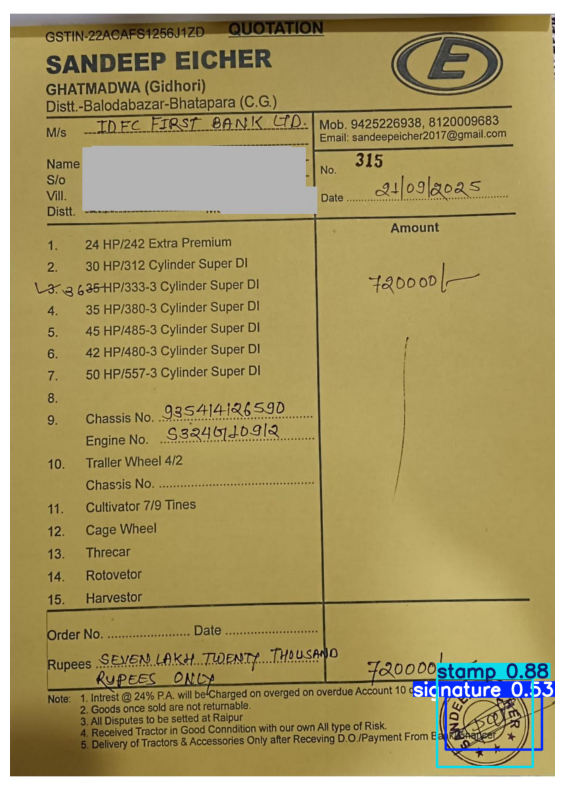

Detected 2 objects

Processing test image 2/19: 90018591220_None_v1_pg1_png.rf.36c7d96f4d350c2f6d795043853b3665.jpg

image 1/1 /content/signature&stamp-2/test/images/90018591220_None_v1_pg1_png.rf.36c7d96f4d350c2f6d795043853b3665.jpg: 640x480 1 signature, 1 stamp, 10.8ms
Speed: 5.6ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90018591220_None_v1_pg1_png.rf.36c7d96f4d350c2f6d795043853b3665.jpg to /content/signature&stamp-2/test_predictions/predicted_90018591220_None_v1_pg1_png.rf.36c7d96f4d350c2f6d795043853b3665.jpg


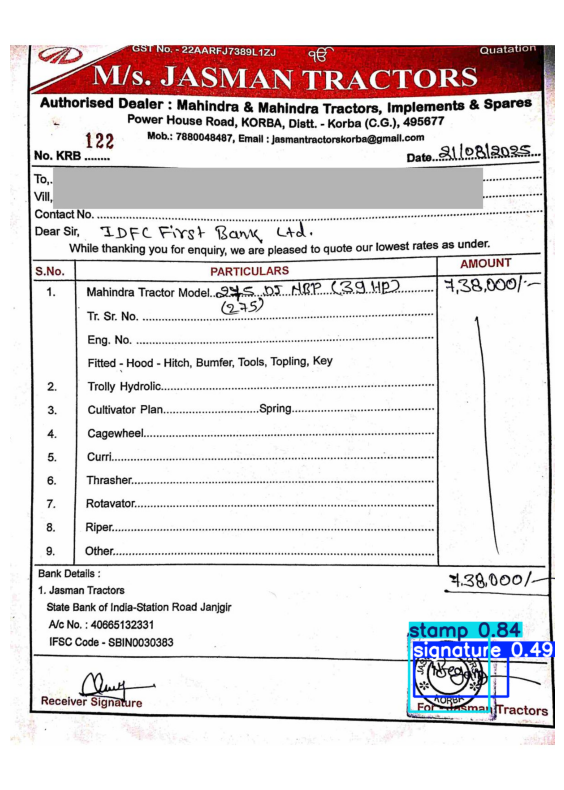

Detected 2 objects

Processing test image 3/19: 90019463369_OTHERS_v1_pg1_png.rf.f41ea6674f1f6b1ff177313010e0c7f8.jpg

image 1/1 /content/signature&stamp-2/test/images/90019463369_OTHERS_v1_pg1_png.rf.f41ea6674f1f6b1ff177313010e0c7f8.jpg: 640x480 1 stamp, 12.5ms
Speed: 4.2ms preprocess, 12.5ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90019463369_OTHERS_v1_pg1_png.rf.f41ea6674f1f6b1ff177313010e0c7f8.jpg to /content/signature&stamp-2/test_predictions/predicted_90019463369_OTHERS_v1_pg1_png.rf.f41ea6674f1f6b1ff177313010e0c7f8.jpg


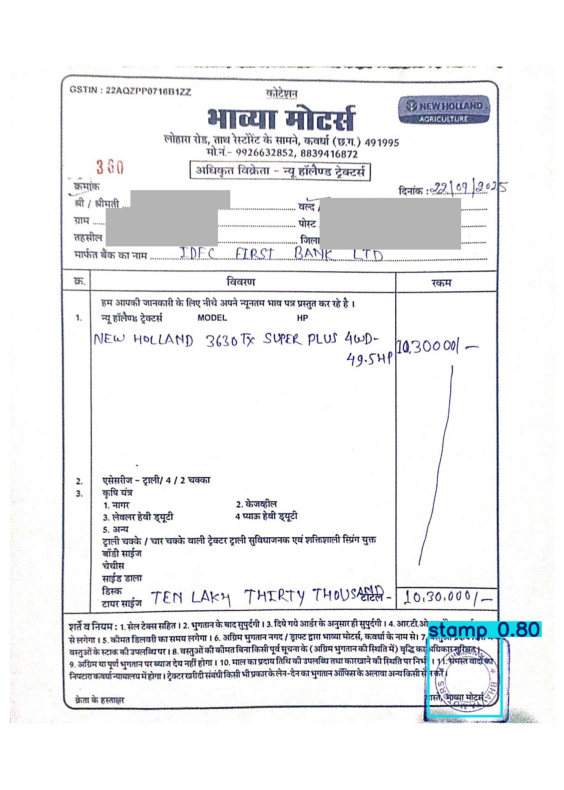

Detected 1 objects

Processing test image 4/19: 90018883186_OTHERS_v1_pg1_png.rf.3f39e48a18048694bcdb7b0c9e83ffdb.jpg

image 1/1 /content/signature&stamp-2/test/images/90018883186_OTHERS_v1_pg1_png.rf.3f39e48a18048694bcdb7b0c9e83ffdb.jpg: 640x480 1 signature, 1 stamp, 10.2ms
Speed: 4.3ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90018883186_OTHERS_v1_pg1_png.rf.3f39e48a18048694bcdb7b0c9e83ffdb.jpg to /content/signature&stamp-2/test_predictions/predicted_90018883186_OTHERS_v1_pg1_png.rf.3f39e48a18048694bcdb7b0c9e83ffdb.jpg


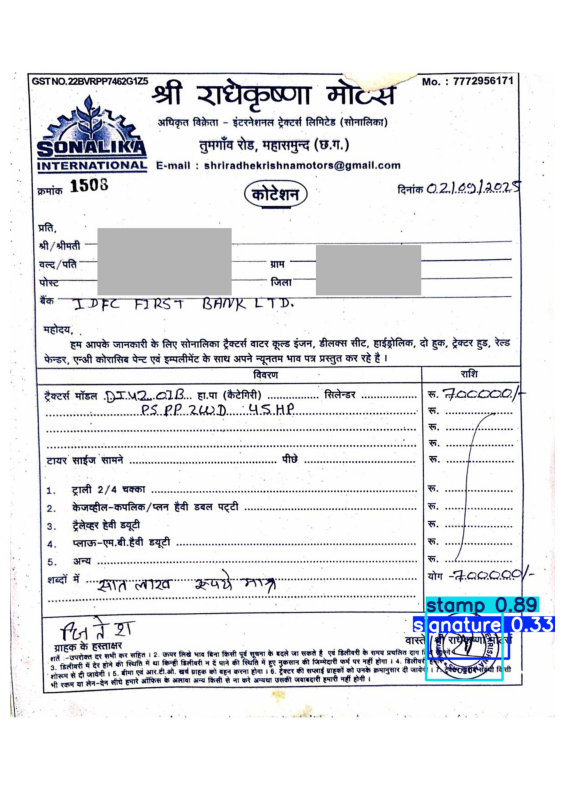

Detected 2 objects

Processing test image 5/19: 90019456877_OTHERS_v1_pg1_png.rf.cb13327b6192f1dd4fb02e7071531ce7.jpg

image 1/1 /content/signature&stamp-2/test/images/90019456877_OTHERS_v1_pg1_png.rf.cb13327b6192f1dd4fb02e7071531ce7.jpg: 640x480 1 signature, 1 stamp, 10.9ms
Speed: 3.9ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90019456877_OTHERS_v1_pg1_png.rf.cb13327b6192f1dd4fb02e7071531ce7.jpg to /content/signature&stamp-2/test_predictions/predicted_90019456877_OTHERS_v1_pg1_png.rf.cb13327b6192f1dd4fb02e7071531ce7.jpg


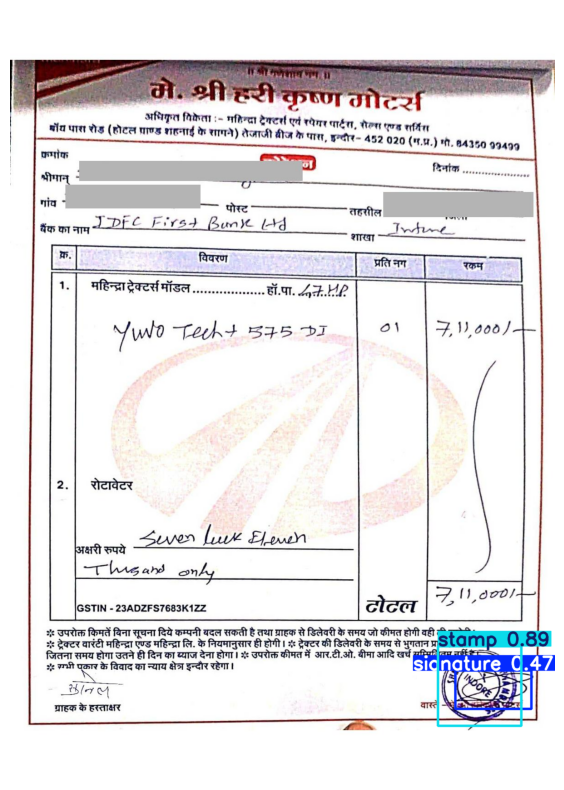

Detected 2 objects

Processing test image 6/19: 90018912387_OTHERS_v1_pg1_png.rf.e560ef35451024530ae89a6e7c00278e.jpg

image 1/1 /content/signature&stamp-2/test/images/90018912387_OTHERS_v1_pg1_png.rf.e560ef35451024530ae89a6e7c00278e.jpg: 640x480 2 signatures, 2 stamps, 17.2ms
Speed: 3.9ms preprocess, 17.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90018912387_OTHERS_v1_pg1_png.rf.e560ef35451024530ae89a6e7c00278e.jpg to /content/signature&stamp-2/test_predictions/predicted_90018912387_OTHERS_v1_pg1_png.rf.e560ef35451024530ae89a6e7c00278e.jpg


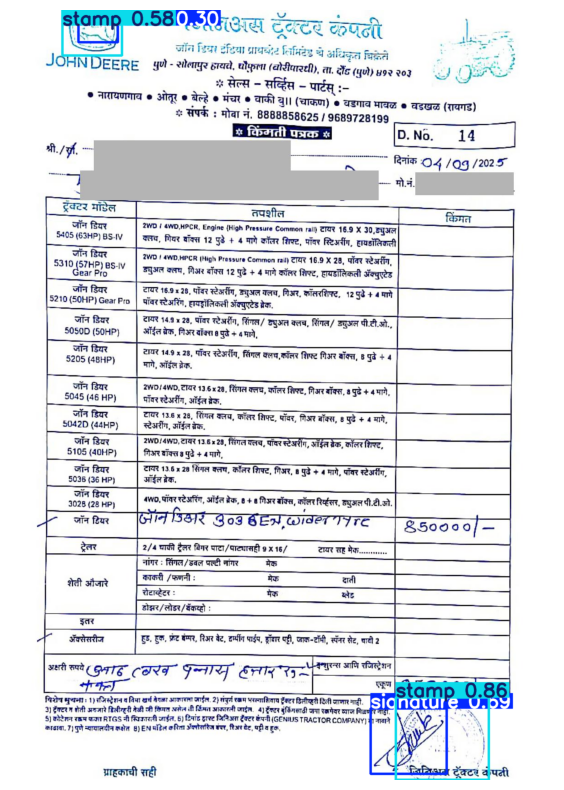

Detected 4 objects

Processing test image 7/19: 90018778186_OTHERS_v1_pg1_png.rf.11c0816d438de21187c822cb81f2311f.jpg

image 1/1 /content/signature&stamp-2/test/images/90018778186_OTHERS_v1_pg1_png.rf.11c0816d438de21187c822cb81f2311f.jpg: 640x480 2 signatures, 1 stamp, 10.6ms
Speed: 4.1ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90018778186_OTHERS_v1_pg1_png.rf.11c0816d438de21187c822cb81f2311f.jpg to /content/signature&stamp-2/test_predictions/predicted_90018778186_OTHERS_v1_pg1_png.rf.11c0816d438de21187c822cb81f2311f.jpg


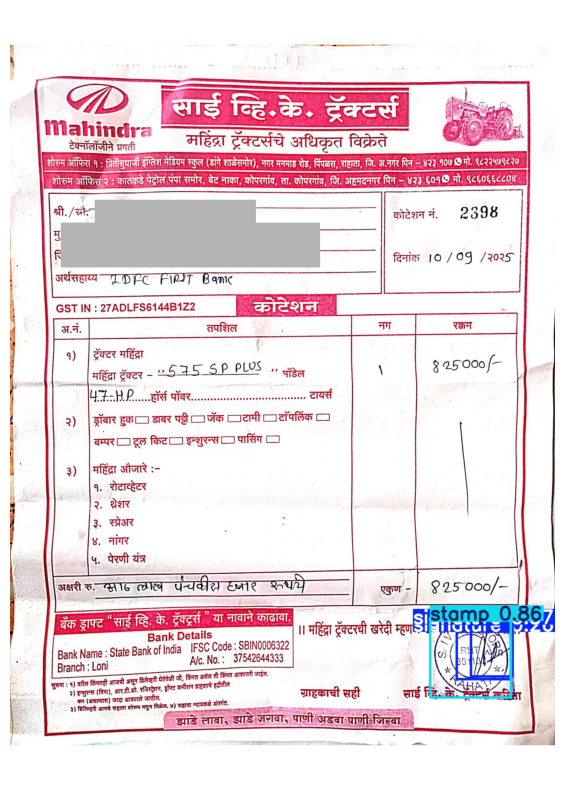

Detected 3 objects

Processing test image 8/19: 172818806_3_pg4_png.rf.46e1b7d1a0079405e75f7e993cbd0a9a.jpg

image 1/1 /content/signature&stamp-2/test/images/172818806_3_pg4_png.rf.46e1b7d1a0079405e75f7e993cbd0a9a.jpg: 640x480 3 signatures, 1 stamp, 12.5ms
Speed: 4.1ms preprocess, 12.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 172818806_3_pg4_png.rf.46e1b7d1a0079405e75f7e993cbd0a9a.jpg to /content/signature&stamp-2/test_predictions/predicted_172818806_3_pg4_png.rf.46e1b7d1a0079405e75f7e993cbd0a9a.jpg


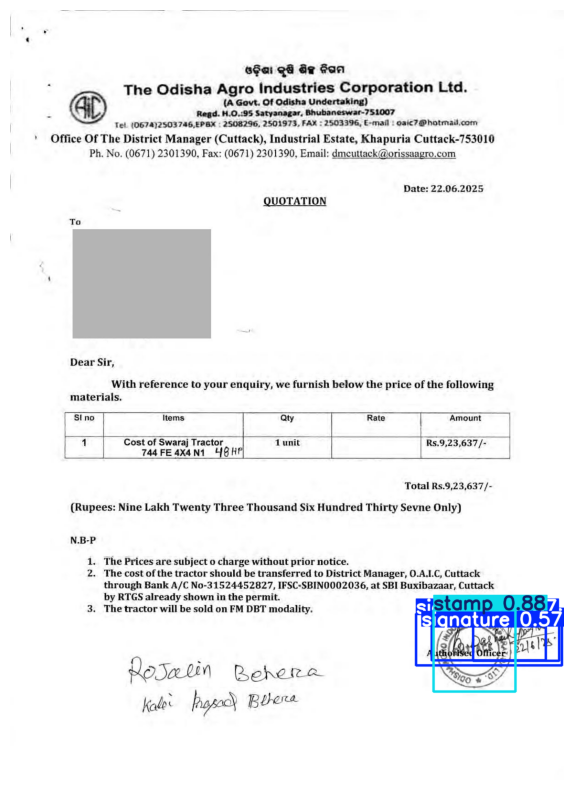

Detected 4 objects

Processing test image 9/19: 90019655984_3_v1_pg1_png.rf.2d5a786140b7842ac761f1d1791d20aa.jpg

image 1/1 /content/signature&stamp-2/test/images/90019655984_3_v1_pg1_png.rf.2d5a786140b7842ac761f1d1791d20aa.jpg: 640x480 2 signatures, 2 stamps, 10.3ms
Speed: 5.3ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90019655984_3_v1_pg1_png.rf.2d5a786140b7842ac761f1d1791d20aa.jpg to /content/signature&stamp-2/test_predictions/predicted_90019655984_3_v1_pg1_png.rf.2d5a786140b7842ac761f1d1791d20aa.jpg


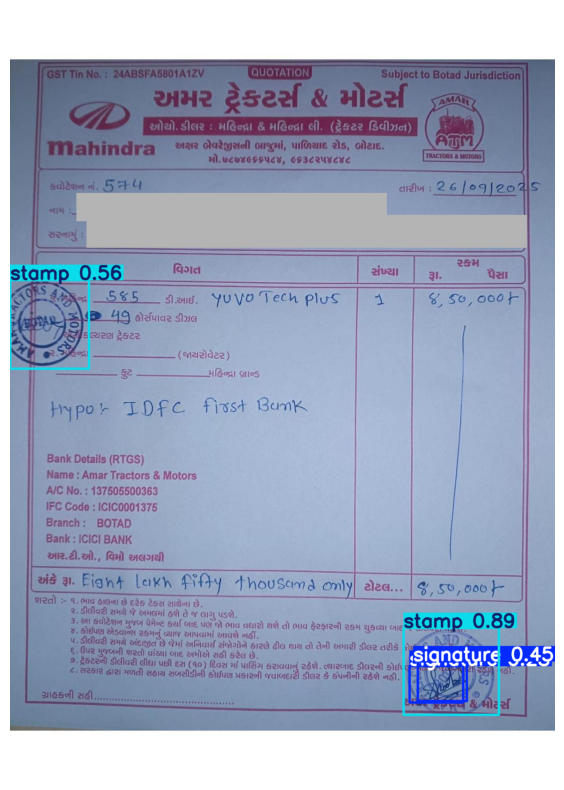

Detected 4 objects

Processing test image 10/19: 90018407639_175335053_1_pg16_png.rf.c3acb81bed641de594bc81df4f45aa87.jpg

image 1/1 /content/signature&stamp-2/test/images/90018407639_175335053_1_pg16_png.rf.c3acb81bed641de594bc81df4f45aa87.jpg: 640x544 1 signature, 1 stamp, 71.8ms
Speed: 4.5ms preprocess, 71.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 544)
Saved prediction for 90018407639_175335053_1_pg16_png.rf.c3acb81bed641de594bc81df4f45aa87.jpg to /content/signature&stamp-2/test_predictions/predicted_90018407639_175335053_1_pg16_png.rf.c3acb81bed641de594bc81df4f45aa87.jpg


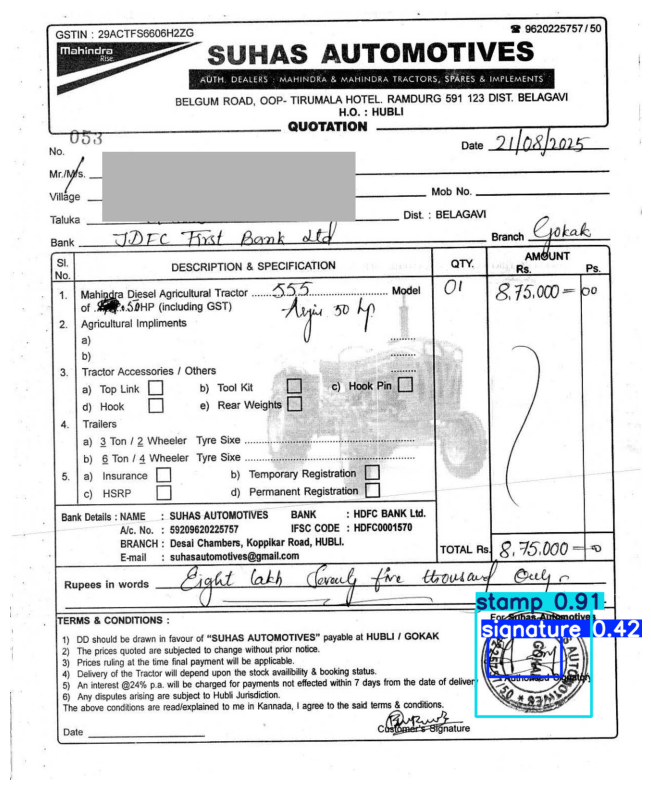

Detected 2 objects

Processing test image 11/19: 90019757162_OTHERS_v1_pg1_png.rf.419f88c255ad94f5a568bd872619bf14.jpg

image 1/1 /content/signature&stamp-2/test/images/90019757162_OTHERS_v1_pg1_png.rf.419f88c255ad94f5a568bd872619bf14.jpg: 640x512 1 signature, 72.8ms
Speed: 4.1ms preprocess, 72.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)
Saved prediction for 90019757162_OTHERS_v1_pg1_png.rf.419f88c255ad94f5a568bd872619bf14.jpg to /content/signature&stamp-2/test_predictions/predicted_90019757162_OTHERS_v1_pg1_png.rf.419f88c255ad94f5a568bd872619bf14.jpg


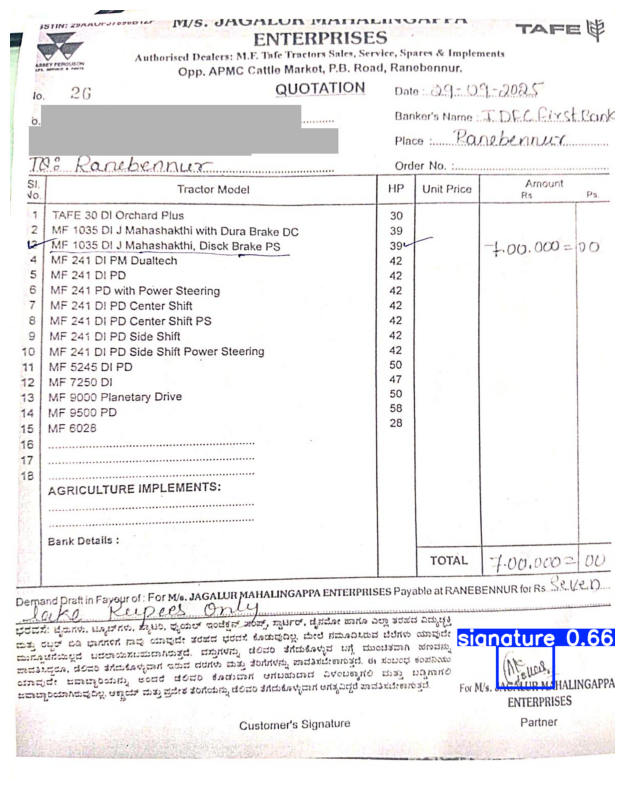

Detected 1 objects

Processing test image 12/19: 173608042_1_pg40_png.rf.fb4a4c04251f9e4109602c65a8090a23.jpg

image 1/1 /content/signature&stamp-2/test/images/173608042_1_pg40_png.rf.fb4a4c04251f9e4109602c65a8090a23.jpg: 640x544 2 signatures, 1 stamp, 11.6ms
Speed: 4.6ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 544)
Saved prediction for 173608042_1_pg40_png.rf.fb4a4c04251f9e4109602c65a8090a23.jpg to /content/signature&stamp-2/test_predictions/predicted_173608042_1_pg40_png.rf.fb4a4c04251f9e4109602c65a8090a23.jpg


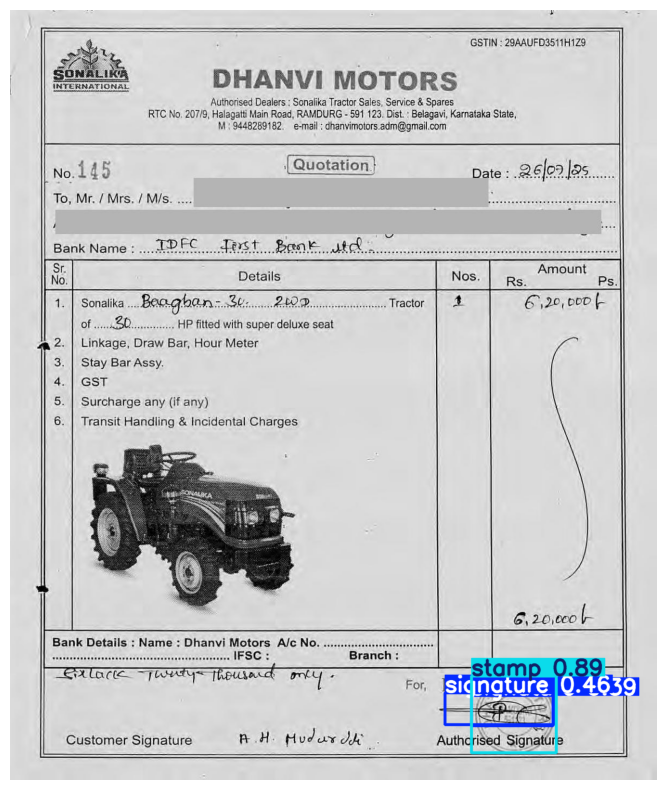

Detected 3 objects

Processing test image 13/19: 90018919209_OTHERS_v1_pg1_png.rf.ce66e37feadb0fcb091e9468c44a97ee.jpg

image 1/1 /content/signature&stamp-2/test/images/90018919209_OTHERS_v1_pg1_png.rf.ce66e37feadb0fcb091e9468c44a97ee.jpg: 640x384 1 signature, 1 stamp, 89.3ms
Speed: 7.5ms preprocess, 89.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)
Saved prediction for 90018919209_OTHERS_v1_pg1_png.rf.ce66e37feadb0fcb091e9468c44a97ee.jpg to /content/signature&stamp-2/test_predictions/predicted_90018919209_OTHERS_v1_pg1_png.rf.ce66e37feadb0fcb091e9468c44a97ee.jpg


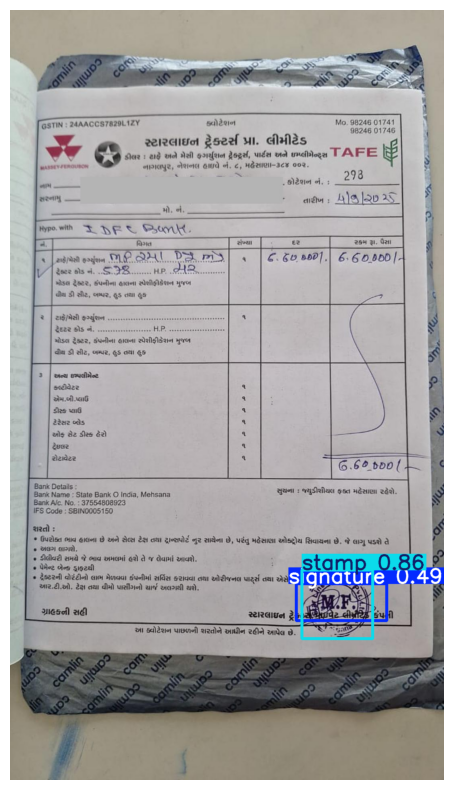

Detected 2 objects

Processing test image 14/19: 172964354_1_pg40_png.rf.6538881e97691238aeafb2afd8eca180.jpg

image 1/1 /content/signature&stamp-2/test/images/172964354_1_pg40_png.rf.6538881e97691238aeafb2afd8eca180.jpg: 640x544 1 signature, 1 stamp, 21.7ms
Speed: 6.5ms preprocess, 21.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 544)
Saved prediction for 172964354_1_pg40_png.rf.6538881e97691238aeafb2afd8eca180.jpg to /content/signature&stamp-2/test_predictions/predicted_172964354_1_pg40_png.rf.6538881e97691238aeafb2afd8eca180.jpg


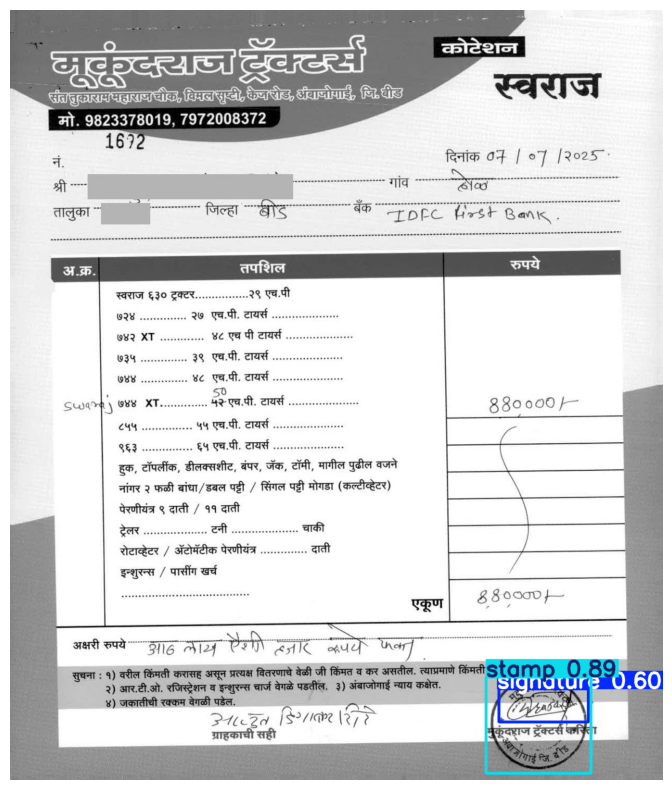

Detected 2 objects

Processing test image 15/19: 90018820019_175153084_1_pg24_png.rf.de8463bebafac41aa4a75efeca4f2968.jpg

image 1/1 /content/signature&stamp-2/test/images/90018820019_175153084_1_pg24_png.rf.de8463bebafac41aa4a75efeca4f2968.jpg: 640x544 1 signature, 1 stamp, 16.5ms
Speed: 5.9ms preprocess, 16.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 544)
Saved prediction for 90018820019_175153084_1_pg24_png.rf.de8463bebafac41aa4a75efeca4f2968.jpg to /content/signature&stamp-2/test_predictions/predicted_90018820019_175153084_1_pg24_png.rf.de8463bebafac41aa4a75efeca4f2968.jpg


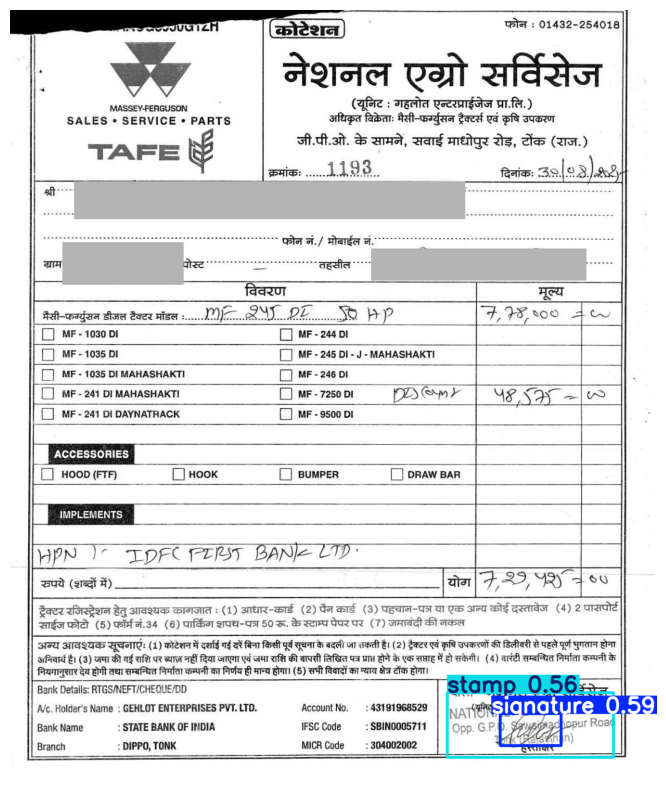

Detected 2 objects

Processing test image 16/19: 90019604068_OTHERS_v1_pg1_png.rf.9c59d112aee5d03513fb6a2cd6580182.jpg

image 1/1 /content/signature&stamp-2/test/images/90019604068_OTHERS_v1_pg1_png.rf.9c59d112aee5d03513fb6a2cd6580182.jpg: 640x512 2 signatures, 1 stamp, 11.9ms
Speed: 4.3ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 512)
Saved prediction for 90019604068_OTHERS_v1_pg1_png.rf.9c59d112aee5d03513fb6a2cd6580182.jpg to /content/signature&stamp-2/test_predictions/predicted_90019604068_OTHERS_v1_pg1_png.rf.9c59d112aee5d03513fb6a2cd6580182.jpg


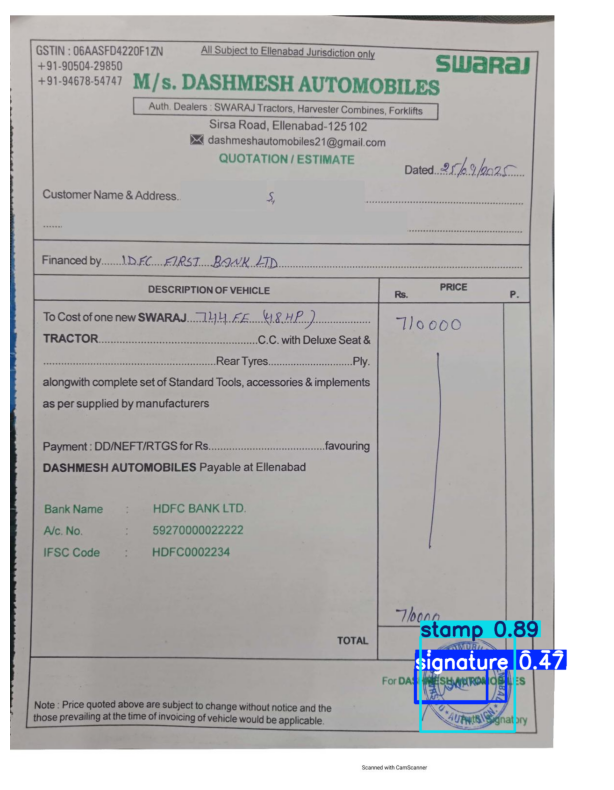

Detected 3 objects

Processing test image 17/19: 173430097_3_pg4_png.rf.72f2313a512ea7f0d70dc3dccaaa21d3.jpg

image 1/1 /content/signature&stamp-2/test/images/173430097_3_pg4_png.rf.72f2313a512ea7f0d70dc3dccaaa21d3.jpg: 640x480 1 signature, 1 stamp, 11.8ms
Speed: 4.0ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 173430097_3_pg4_png.rf.72f2313a512ea7f0d70dc3dccaaa21d3.jpg to /content/signature&stamp-2/test_predictions/predicted_173430097_3_pg4_png.rf.72f2313a512ea7f0d70dc3dccaaa21d3.jpg


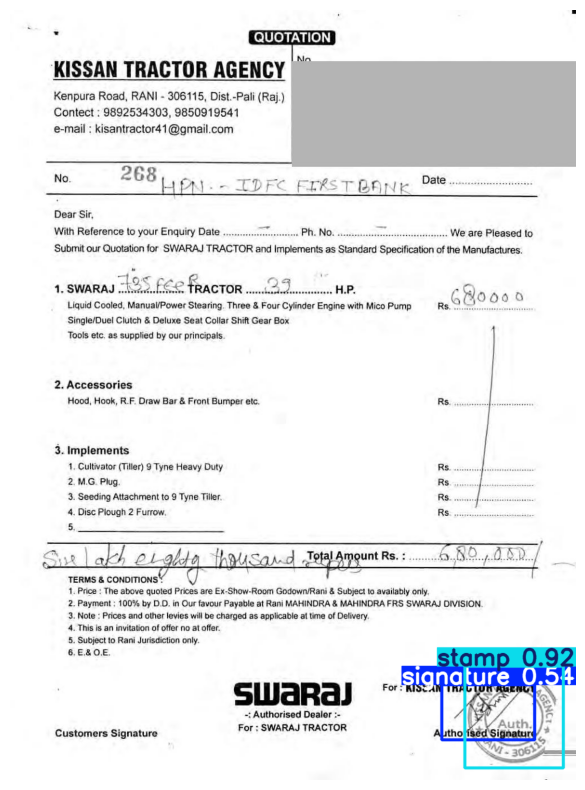

Detected 2 objects

Processing test image 18/19: 173254922_3_pg3_png.rf.5ea909a9a3b97b147caa8f2ad2091ac8.jpg

image 1/1 /content/signature&stamp-2/test/images/173254922_3_pg3_png.rf.5ea909a9a3b97b147caa8f2ad2091ac8.jpg: 640x480 2 stamps, 14.2ms
Speed: 5.6ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 173254922_3_pg3_png.rf.5ea909a9a3b97b147caa8f2ad2091ac8.jpg to /content/signature&stamp-2/test_predictions/predicted_173254922_3_pg3_png.rf.5ea909a9a3b97b147caa8f2ad2091ac8.jpg


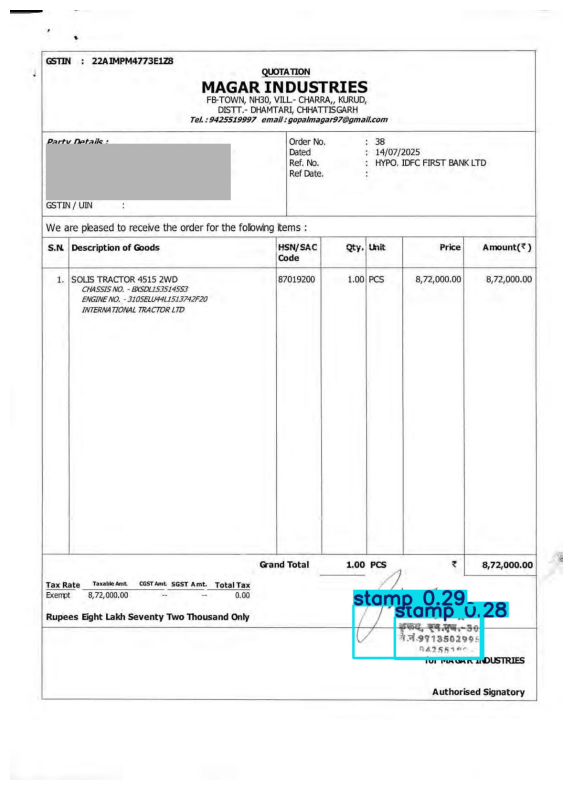

Detected 2 objects

Processing test image 19/19: 90019665101_OTHERS_v1_pg1_png.rf.b4fa2f7de097e262202f217b51605263.jpg

image 1/1 /content/signature&stamp-2/test/images/90019665101_OTHERS_v1_pg1_png.rf.b4fa2f7de097e262202f217b51605263.jpg: 640x480 1 signature, 1 stamp, 11.6ms
Speed: 4.0ms preprocess, 11.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)
Saved prediction for 90019665101_OTHERS_v1_pg1_png.rf.b4fa2f7de097e262202f217b51605263.jpg to /content/signature&stamp-2/test_predictions/predicted_90019665101_OTHERS_v1_pg1_png.rf.b4fa2f7de097e262202f217b51605263.jpg


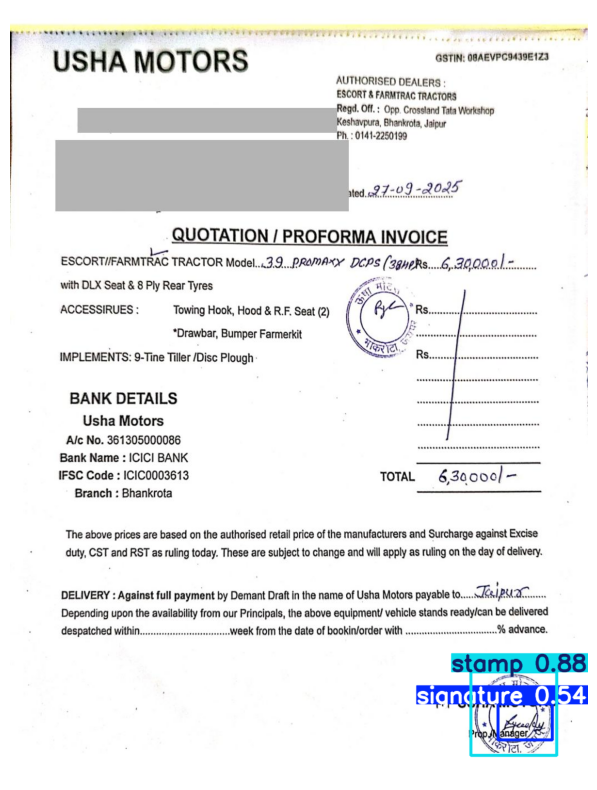

Detected 2 objects


In [ ]:

# Get the list of test images
test_images_dir = BASE_DIR / 'test/images'
test_images = list(test_images_dir.glob('*'))

# Create a directory to save prediction images
predictions_dir = BASE_DIR / 'test_predictions'
predictions_dir.mkdir(exist_ok=True)

print(f"\nRunning inference on {len(test_images)} test images and saving results to {predictions_dir}...")

for i, img_path in enumerate(test_images):
    print(f"\nProcessing test image {i+1}/{len(test_images)}: {img_path.name}")
    results = model(img_path, conf=0.25)

    # Get the plotted image with bounding boxes
    plotted_img = results[0].plot()[:,:,::-1] # OpenCV uses BGR, matplotlib uses RGB, so convert back

    # Save the plotted image
    save_path = predictions_dir / f"predicted_{img_path.name}"
    cv2.imwrite(str(save_path), plotted_img)

    print(f"Saved prediction for {img_path.name} to {save_path}")

    # Optional: Display the results (if you still want to see them in output)
    plt.figure(figsize=(15, 10))
    plt.imshow(plotted_img)
    plt.axis('off')
    plt.show()

    print(f"Detected {len(results[0].boxes)} objects")
